### **Transfer Learning with TensorFlow Part 3: Scaling up (🍔👁️ Food Vision mini)**

In [1]:
# Import functions
from functions import create_tensorboad_callback, plot_loss_curves, unzip_data, walk_through_dir

In [3]:
unzip_data('data/101_food_classes_10_percent.zip', dest='data')

train_dir = 'data/101_food_classes_10_percent/train'
test_dir = 'data/101_food_classes_10_percent/test'

In [4]:
# How many images/classes are there
walk_through_dir('data/101_food_classes_10_percent')

There are 2 directories and 0 images in "data/101_food_classes_10_percent".
There are 101 directories and 0 images in "data/101_food_classes_10_percent\test".
There are 0 directories and 250 images in "data/101_food_classes_10_percent\test\apple_pie".
There are 0 directories and 250 images in "data/101_food_classes_10_percent\test\baby_back_ribs".
There are 0 directories and 250 images in "data/101_food_classes_10_percent\test\baklava".
There are 0 directories and 250 images in "data/101_food_classes_10_percent\test\beef_carpaccio".
There are 0 directories and 250 images in "data/101_food_classes_10_percent\test\beef_tartare".
There are 0 directories and 250 images in "data/101_food_classes_10_percent\test\beet_salad".
There are 0 directories and 250 images in "data/101_food_classes_10_percent\test\beignets".
There are 0 directories and 250 images in "data/101_food_classes_10_percent\test\bibimbap".
There are 0 directories and 250 images in "data/101_food_classes_10_percent\test\bread_

In [5]:
# Setup data inputs
import tensorflow as tf
IMG_SIZE = (224, 224)

train_data = tf.keras.preprocessing.image_dataset_from_directory(directory=train_dir,
                                                                 label_mode='categorical',
                                                                 image_size=IMG_SIZE)

test_data = tf.keras.preprocessing.image_dataset_from_directory(directory=test_dir,
                                                                label_mode='categorical',
                                                                image_size=IMG_SIZE,
                                                                shuffle=False) # don't shuffle test data for pred analysis

Found 7575 files belonging to 101 classes.
Found 25250 files belonging to 101 classes.


### **Train a big dog model with transfer learning on 10% of 101 food classes**

Here are the steps we're going to take:
* Create a ModelCheckpoint callback
* Create a data augmentation layer to build data augmentation right into the model
* Build a headless (no top leayers) Functional EfficientNetB0 backboned-mode (we'll create our own output layer)
* Compile the model
* Feature extract for 5 full passes 

In [6]:
# Create checkpoint callback
checkpoint_path = '101_checkpoints/101_classes_10_percent_data_model_checkpoint'
chechpoing_callback = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path,
                                                         save_weights_only=True,
                                                         monitor='val_accuracy',
                                                         save_best_only=True)

In [8]:
# Create data augmentation layer
from tensorflow.keras import layers
from tensorflow.keras.layers.experimental import preprocessing
from tensorflow.keras.models import Sequential

data_augmentation = Sequential([
    preprocessing.RandomFlip('horizontal'),
    preprocessing.RandomRotation(0.2),
    preprocessing.RandomHeight(0.2),
    preprocessing.RandomWidth(0.2),
    preprocessing.RandomZoom(0.2),
    # preprocessing.Rescaling(1/255)
], name='data_augmentation')

In [10]:
# Setup the base model and freeze its layers
base_model = tf.keras.applications.EfficientNetB0(include_top=False)
base_model.trainable = False

# Setup model architecture with trainable top layers
inputs = layers.Input(shape=(224, 224, 3), name='input_layer')
x = data_augmentation(inputs) # augment images
x = base_model(x, training=False) # freeze the weights
x = layers.GlobalAveragePooling2D(name='global_avg_pool_layer')(x)
outputs = layers.Dense(len(train_data.class_names), activation='softmax', name='output_layer')(x)
model = tf.keras.Model(inputs, outputs)

In [11]:
# Get a summary of a model
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (InputLayer)    [(None, 224, 224, 3)]     0         
                                                                 
 data_augmentation (Sequenti  (None, 224, 224, 3)      0         
 al)                                                             
                                                                 
 efficientnetb0 (Functional)  (None, None, None, 1280)  4049571  
                                                                 
 global_avg_pool_layer (Glob  (None, 1280)             0         
 alAveragePooling2D)                                             
                                                                 
 output_layer (Dense)        (None, 101)               129381    
                                                                 
Total params: 4,178,952
Trainable params: 129,381
Non-trainab

In [15]:
# Compile a model
model.compile(loss=tf.keras.losses.CategoricalCrossentropy(),
              optimizer=tf.keras.optimizers.Adam(),
              metrics=['accuracy'])

# Fit the model
history = model.fit(train_data,
                    epochs=5,
                    validation_data=test_data,
                    validation_steps=int(0.15*len(test_data)),
                    callbacks=[chechpoing_callback])

Epoch 1/5
237/237 [==============================] - 589s 2s/step - loss: 3.3918 - accuracy: 0.2685 - val_loss: 2.4293 - val_accuracy: 0.4748
Epoch 2/5
237/237 [==============================] - 579s 2s/step - loss: 2.1948 - accuracy: 0.4995 - val_loss: 1.9849 - val_accuracy: 0.5310
Epoch 3/5
237/237 [==============================] - 606s 3s/step - loss: 1.8273 - accuracy: 0.5626 - val_loss: 1.8004 - val_accuracy: 0.5620
Epoch 4/5
140/237 [================>.............] - ETA: 2:38 - loss: 1.6358 - accuracy: 0.6123

KeyboardInterrupt: 

In [ ]:
# Evaluate on whole data set
feature_extraction_results = model.evaluate(test_data)

In [ ]:
# Plot loss curves
plot_loss_curves(history)

Looks like the model is very likely overfitting.

### **Fine-tuning**

In [ ]:
# Unfreeze all of the layers in the base model
base_model.trainable = True

# Refreeze every layer except the last 5
for layer in base_model.layers[:-5]:
    layer.trainable = False

In [ ]:
#
model.compile(loss=tf.keras.losses.BinaryCrossentropy(),
              optimizer=tf.keras.optimizers.Adam(leraning_rate=0.0001), #lower the learning rate be 10x
              metrics=['accuracy'])

In [ ]:
# What layers in the model are trainable?
for layer in model.layers:
    print(layer.name, layer.trainable)

In [ ]:
# Check which layers are trainable in base model
for layer_number, layer in enumerate(model.layers[2].layers):
    print(layer_number, layer.name, layer.trainable)

In [ ]:
# Fine-tune for 5 more epochs
fine_tune_epochs = 10

# Fine-tune the model
history_fine_tune = model.fit(train_data,
                              epochs=fine_tune_epochs,
                              validation_data=test_data,
                              validation_steps=int(0.15*len(test_data)),
                              initial_epoch=history.epoch[-1])

In [ ]:
# Evaluate on the wole test data
fine_tuning_results = model.evaluate(test_data)

In [ ]:
# Compare histories of feature extraction model with fine-tuning model
from functions import compare_histories
compare_histories(original_history=history, 
                  new_history=history_fine_tune)

### **Saving and loading a model**

In [ ]:
# Save the model
model.save('saved_models/101_food_classes_10_percent')

In [ ]:
# Load and evaluate saved model
loaded_model = tf.keras.models.load_model('saved_models/101_food_classes_10_percent')

loaded_model_results = loaded_model.evaluate(test_data)

### **Evaluating the performance of the big dog model**

Make predictions and find out which of them are the most wrong.

In [16]:
# Load the model
model = tf.keras.models.load_model('saved_models/06_101_food_class_10_percent_saved_big_dog_model')

In [ ]:
# Evaluate loaded model
results_downloaded_model = model.evaluate(test_data)

### **Making predictions with trained model**

In [18]:
# Make predictions with model
preds_probs = model.predict(test_data, verbose=1)

790/790 [==============================] - 1301s 2s/step


In [19]:
# How many predictions are there
len(preds_probs)

25250

In [20]:
# What's the shape of predictions?
preds_probs.shape

(25250, 101)

In [21]:
# Let's see what the first 10 predcitions look like
preds_probs[:10]

array([[5.95419034e-02, 3.57424688e-06, 4.13772650e-02, ...,
        1.41387235e-09, 8.35316459e-05, 3.08974599e-03],
       [9.64016676e-01, 1.37531131e-09, 8.47797201e-04, ...,
        5.42870948e-05, 7.83619003e-12, 9.84654580e-10],
       [9.59258497e-01, 3.25337023e-05, 1.48671144e-03, ...,
        7.18918045e-07, 5.43963154e-07, 4.02758014e-05],
       ...,
       [4.73134488e-01, 1.29312610e-07, 1.48055737e-03, ...,
        5.97502512e-04, 6.69690999e-05, 2.34692561e-05],
       [4.45716865e-02, 4.72654591e-07, 1.22585185e-01, ...,
        6.34990192e-06, 7.53184077e-06, 3.67787108e-03],
       [7.24389672e-01, 1.92498817e-09, 5.23110939e-05, ...,
        1.22914324e-03, 1.57928071e-09, 9.63955827e-05]], dtype=float32)

In [22]:
# What doest the first prediction probability array look like?
preds_probs[0], len(preds_probs[0]), sum(preds_probs[0])

(array([5.95419034e-02, 3.57424688e-06, 4.13772650e-02, 1.06607501e-09,
        8.16160828e-09, 8.66409167e-09, 8.09276798e-07, 8.56530846e-07,
        1.98590387e-05, 8.09790947e-07, 3.17280802e-09, 9.86758323e-07,
        2.85324117e-04, 7.80498777e-10, 7.42300297e-04, 3.89166453e-05,
        6.47413708e-06, 2.49773097e-06, 3.78915029e-05, 2.06784108e-07,
        1.55386788e-05, 8.15068859e-07, 2.62305730e-06, 2.00107650e-07,
        8.38278709e-07, 5.42164662e-06, 3.73913281e-06, 1.31505740e-08,
        2.77614361e-03, 2.80514669e-05, 6.85631496e-10, 2.55750092e-05,
        1.66889164e-04, 7.64083963e-10, 4.04533086e-04, 1.31507738e-08,
        1.79575704e-06, 1.44483420e-06, 2.30632778e-02, 8.24678239e-07,
        8.53668496e-07, 1.71386000e-06, 7.05257207e-06, 1.84024351e-08,
        2.85538761e-07, 7.94830248e-06, 2.06820096e-06, 1.85253327e-07,
        3.36200046e-08, 3.15228302e-04, 1.04110841e-05, 8.54502559e-07,
        8.47418010e-01, 1.05556092e-05, 4.40948043e-07, 3.740471

The model outputs prediction probability array (with N number of variables, where N is number of classes) for each sample passed top the predict method.

In [23]:
# We get one prediction probability per class
print(f'Number of prediction probabilities for sample 0: {len(preds_probs[0])}')
print(f'What prediction probability sample 0 looks like:\n {preds_probs[0]}')
print(f'The class with the highest predicted probability for sample 0: {tf.argmax(preds_probs[0])}')

Number of prediction probabilities for sample 0: 101
What prediction probability sample 0 looks like:
 [5.95419034e-02 3.57424688e-06 4.13772650e-02 1.06607501e-09
 8.16160828e-09 8.66409167e-09 8.09276798e-07 8.56530846e-07
 1.98590387e-05 8.09790947e-07 3.17280802e-09 9.86758323e-07
 2.85324117e-04 7.80498777e-10 7.42300297e-04 3.89166453e-05
 6.47413708e-06 2.49773097e-06 3.78915029e-05 2.06784108e-07
 1.55386788e-05 8.15068859e-07 2.62305730e-06 2.00107650e-07
 8.38278709e-07 5.42164662e-06 3.73913281e-06 1.31505740e-08
 2.77614361e-03 2.80514669e-05 6.85631496e-10 2.55750092e-05
 1.66889164e-04 7.64083963e-10 4.04533086e-04 1.31507738e-08
 1.79575704e-06 1.44483420e-06 2.30632778e-02 8.24678239e-07
 8.53668496e-07 1.71386000e-06 7.05257207e-06 1.84024351e-08
 2.85538761e-07 7.94830248e-06 2.06820096e-06 1.85253327e-07
 3.36200046e-08 3.15228302e-04 1.04110841e-05 8.54502559e-07
 8.47418010e-01 1.05556092e-05 4.40948043e-07 3.74047195e-05
 3.53067080e-05 3.24893263e-05 6.73146278e-

In [24]:
# Get the pred classes for each label
pred_classes = preds_probs.argmax(axis=1)

# How do they look?
pred_classes[:10]

array([52,  0,  0, 80, 79, 61, 29,  0, 85,  0], dtype=int64)

In [25]:
# How many pred classes do we have?
len(pred_classes)

25250

Now we've got predictions array of all of our model's predictions, to evaluate them we need to comapre them to the original labels.

In [26]:
# Test data is now in batches
test_data, len(test_data)

(<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 101), dtype=tf.float32, name=None))>,
 790)

In [27]:
# To get test labels we need to unravel test_data BatchDataset
y_labels = []
for images, labels in test_data.unbatch():
    y_labels.append(labels.numpy().argmax()) # labels are one-hot encoded now, that's why .argmax()

y_labels[:10]

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

In [28]:
# How many y_labels are there?
len(y_labels)

25250

### **Evaluating model's predictions**

Way to check if model's predictions are in the same order as test labels is to find the accuracy score.

In [30]:
# Let's try scikit-learn's accuracy score function and see what it comes up with
from sklearn.metrics import accuracy_score
sklearn_accuracy = accuracy_score(y_true=y_labels,
                                  y_pred=pred_classes)
sklearn_accuracy

0.6077623762376237

### **Get visual making confusion matrix**

In [32]:
# Get a list of class names
class_names = test_data.class_names
class_names[:10]

['apple_pie',
 'baby_back_ribs',
 'baklava',
 'beef_carpaccio',
 'beef_tartare',
 'beet_salad',
 'beignets',
 'bibimbap',
 'bread_pudding',
 'breakfast_burrito']

In [39]:
import functions
import importlib
importlib.reload(functions)

<module 'functions' from 'd:\\1. Projects\\5. TensorFlow and Deep Learning Fundamentals\\functions.py'>

In [49]:
# There are some changes needed for create_confusion_matrix function
def make_confusion_matrix(y_true, y_pred, classes=None, figsize=(10,10), color_bar=False, text_size=15, savefig=False):

    import itertools
    from sklearn.metrics import confusion_matrix
    import numpy as np
    import matplotlib.pyplot as plt

    cm = confusion_matrix(y_true, y_pred)
    cm_norm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis] # normalize our confusion matrix
    n_classes = cm.shape[0]

    # Let's prettify it
    fig, ax = plt.subplots(figsize=figsize)
    cax = ax.matshow(cm, cmap=plt.cm.Blues) # plot the values of a 2D matrix or array as color-coded image.
    if color_bar == True:
        fig.colorbar(cax) # colorbar

    # Set labels to be classes
    if classes:
        labels = classes
    else:
        labels = np.arange(cm.shape[0])

    # Label the axis 
    ax.set(title='Confusion Matrix',
        xlabel='Predicted Label',
        ylabel='True Label',
        xticks=np.arange(n_classes),
        yticks=np.arange(n_classes),
        xticklabels=labels,
        yticklabels=labels)

    # Set x-axis labels to the bottom
    ax.xaxis.set_label_position('bottom')
    ax.xaxis.tick_bottom()

    # Changed (plot x-labels vertically)
    plt.xticks(rotation=70, fontsize=text_size)
    plt.yticks(fontsize=text_size)

    # Adjust label size
    ax.yaxis.label.set_size(text_size)
    ax.xaxis.label.set_size(text_size)
    ax.title.set_size(text_size+5)

    # Set the threshold for different colors
    threshold = (cm.max() + cm.min()) / 2

    # Plot the text on each cell
    for i,j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i , f'{cm[i, j]} ({cm_norm[i, j]*100:.1f}%)',
                horizontalalignment='center',
                color='white' if cm[i, j] > threshold else 'black',
                size=text_size)
    
    # Save the fig
    if savefig:
        fig.savefig('confusion_matrix.png')

In [50]:
make_confusion_matrix(y_true=y_labels,
                      y_pred=pred_classes,
                      classes=class_names,
                      figsize=(100, 100),
                      text_size=20,
                      savefig=True)

### **Classification report**

Scikit-learn has ma helpful function to acquiring many different classification metrics pre class (e.g. precision, recall and F1) called classification_report.

In [54]:
from sklearn.metrics import classification_report
print(classification_report(y_true=y_labels,
                            y_pred=pred_classes))

              precision    recall  f1-score   support

           0       0.29      0.20      0.24       250
           1       0.51      0.69      0.59       250
           2       0.56      0.65      0.60       250
           3       0.74      0.53      0.62       250
           4       0.73      0.43      0.54       250
           5       0.34      0.54      0.42       250
           6       0.67      0.79      0.72       250
           7       0.82      0.76      0.79       250
           8       0.40      0.37      0.39       250
           9       0.62      0.44      0.51       250
          10       0.62      0.42      0.50       250
          11       0.84      0.49      0.62       250
          12       0.52      0.74      0.61       250
          13       0.56      0.60      0.58       250
          14       0.56      0.59      0.57       250
          15       0.44      0.32      0.37       250
          16       0.45      0.75      0.57       250
          17       0.37    

Above is a great class-by-class evaluation of predictions.

In [59]:
# Get a dictionary of the classification report
classification_report_dict = classification_report(y_labels, pred_classes, output_dict=True)
classification_report_dict

{'0': {'precision': 0.29310344827586204,
  'recall': 0.204,
  'f1-score': 0.24056603773584903,
  'support': 250},
 '1': {'precision': 0.5088235294117647,
  'recall': 0.692,
  'f1-score': 0.5864406779661017,
  'support': 250},
 '2': {'precision': 0.5625,
  'recall': 0.648,
  'f1-score': 0.6022304832713754,
  'support': 250},
 '3': {'precision': 0.7415730337078652,
  'recall': 0.528,
  'f1-score': 0.616822429906542,
  'support': 250},
 '4': {'precision': 0.7346938775510204,
  'recall': 0.432,
  'f1-score': 0.544080604534005,
  'support': 250},
 '5': {'precision': 0.34177215189873417,
  'recall': 0.54,
  'f1-score': 0.41860465116279066,
  'support': 250},
 '6': {'precision': 0.6677966101694915,
  'recall': 0.788,
  'f1-score': 0.7229357798165138,
  'support': 250},
 '7': {'precision': 0.8197424892703863,
  'recall': 0.764,
  'f1-score': 0.7908902691511386,
  'support': 250},
 '8': {'precision': 0.4025974025974026,
  'recall': 0.372,
  'f1-score': 0.3866943866943867,
  'support': 250},
 '9

In [60]:
class_names[:3]

['apple_pie', 'baby_back_ribs', 'baklava']

Let's plot all of classes F1-scores

In [62]:
# Create empty dictionary
class_f1_scores = {}
# Loop through classification report dictionary items
for k, v in classification_report_dict.items():
    if k == 'accuracy': # stop once we get to accuracy key
        break
    else:
        # Add class names and f1-scorse to new dictionary
        class_f1_scores[class_names[int(k)]] = v['f1-score']

class_f1_scores

{'apple_pie': 0.24056603773584903,
 'baby_back_ribs': 0.5864406779661017,
 'baklava': 0.6022304832713754,
 'beef_carpaccio': 0.616822429906542,
 'beef_tartare': 0.544080604534005,
 'beet_salad': 0.41860465116279066,
 'beignets': 0.7229357798165138,
 'bibimbap': 0.7908902691511386,
 'bread_pudding': 0.3866943866943867,
 'breakfast_burrito': 0.5117370892018779,
 'bruschetta': 0.5047619047619047,
 'caesar_salad': 0.6161616161616161,
 'cannoli': 0.6105610561056106,
 'caprese_salad': 0.5775193798449612,
 'carrot_cake': 0.574757281553398,
 'ceviche': 0.36744186046511623,
 'cheese_plate': 0.5654135338345864,
 'cheesecake': 0.42546063651591287,
 'chicken_curry': 0.5008403361344538,
 'chicken_quesadilla': 0.6411889596602972,
 'chicken_wings': 0.7123809523809523,
 'chocolate_cake': 0.45261669024045265,
 'chocolate_mousse': 0.3291592128801431,
 'churros': 0.7134935304990757,
 'clam_chowder': 0.7708779443254817,
 'club_sandwich': 0.734020618556701,
 'crab_cakes': 0.4625550660792952,
 'creme_brulee

In [66]:
# Turn f1-scores into dataframe for visualization
import pandas as pd
f1_scores = pd.DataFrame({'class_names': list(class_f1_scores.keys()),
                          'f1-score': list(class_f1_scores.values())}).sort_values('f1-score', ascending=False)
f1_scores


,class_names,f1-score
33,edamame,0.937143
63,macarons,0.895397
75,pho,0.866538
91,spaghetti_carbonara,0.847656
69,oysters,0.834008
...,...,...
56,huevos_rancheros,0.339833
22,chocolate_mousse,0.329159
77,pork_chop,0.308756
39,foie_gras,0.297491


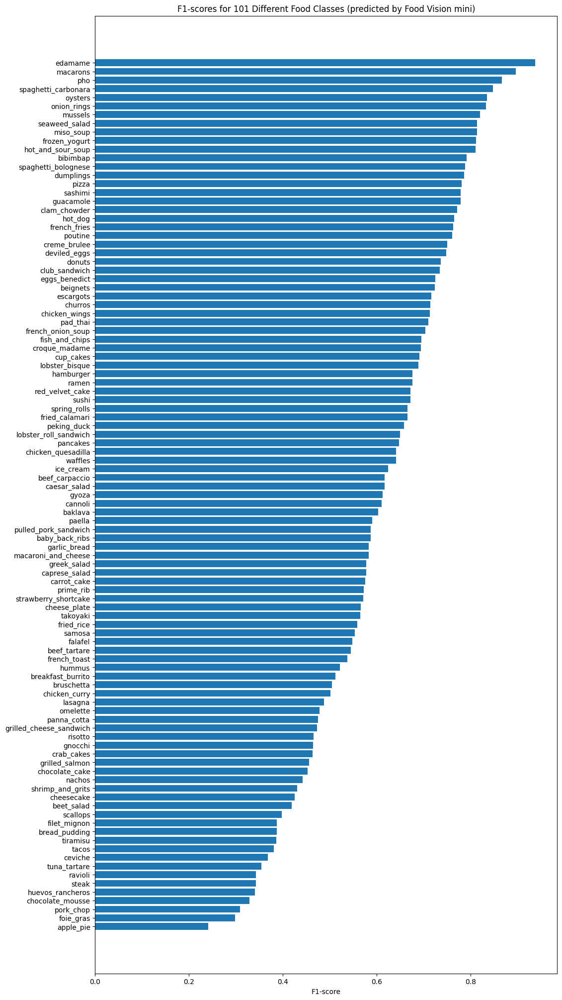

In [77]:
import matplotlib.pyplot as plt
fig, ax = plt.subplots(figsize=(12, 25))
scores = ax.barh(range(len(f1_scores)), f1_scores['f1-score'].values) # get f1-scores
ax.set_yticks(range(len(f1_scores)))
ax.set_yticklabels(f1_scores['class_names'])
ax.set_xlabel('F1-score')
ax.set_title('F1-scores for 101 Different Food Classes (predicted by Food Vision mini)')
ax.invert_yaxis();

### **Visualizing predictions on custom images**

Now this is the real test, how does the model go on food images not even in test dataset.

To visualize model's prediction on own images there is a function needed to load an preprocess images. Specifically it will need to:
* Read in a target image filepath using `tf.io.read_file()`
* Turn the image into a Tensor using `tf.io.decode_image()`
* Resize the image tensor to be the same size as the images the model has trained on using `tf.image.resize()`
* Scale the image to get all of the pixel values between 0 & 1 (if necessary)

In [78]:
# Create a function to load and prepare images
def load_and_prep_image(filename, img_shape=224, scale=True):
    """
    Read in an image from filename, turns it into a tensor and 
    reshapes into specified shape (img_shape, img_shape, 3)

    Args:
        filename (str): path to target image
        img_shape (int): height/width dimension of target image size
        scale (bool): scale pixel values from 0-255 to 0-1 or not

    Returns:
        Image tensor of shape (img_shape, img_shape, 3)
    """
    # Read in the image
    img = tf.io.read_file(filename)

    # Decode image into tensor
    img = tf.io.decode_image(img, channels=3)

    # Resize the image
    img = tf.image.resize(img, [img_shape, img_shape])

    # Scale? Yes/No
    if scale:
        # rescale the image (get all values between 0 and 1)
        return img/255
    else:
        return img

Steps:
1. Load a few images from the test dataset
2. Make predictions 
3. Plot the original images along with the model's predictions

data/101_food_classes_10_percent/test/tiramisu/2658287.jpg
1/1 [==============================] - 0s 57ms/step
data/101_food_classes_10_percent/test/guacamole/3253675.jpg
1/1 [==============================] - 0s 62ms/step
data/101_food_classes_10_percent/test/escargots/364726.jpg
1/1 [==============================] - 0s 66ms/step


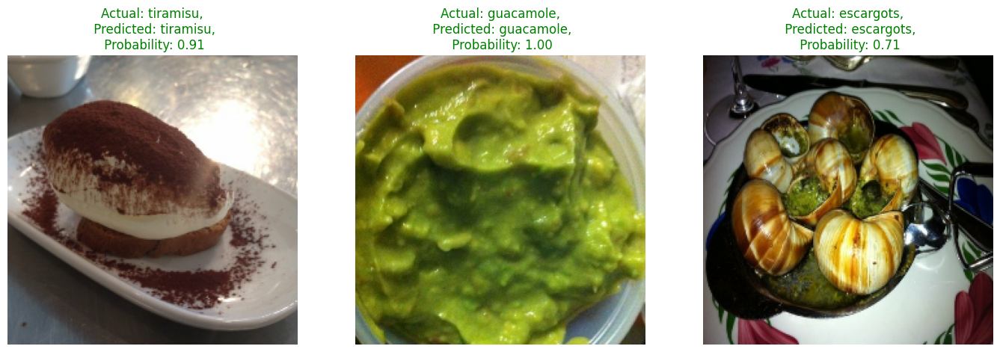

In [96]:
# Make preds on a series of random images
import os
import random

plt.figure(figsize=(17, 10))
for i in range(3):
    # Choose a random images from a random classes
    class_name = random.choice(class_names)
    filename = random.choice(os.listdir(test_dir + '/' + class_name))
    filepath = test_dir + '/' + class_name + '/' + filename
    print(filepath)

    # Load the image and make predictions
    img = load_and_prep_image(filepath, scale=False)
    pred_prob = model.predict(tf.expand_dims(img, axis=0)) # get prediction probability array
    pred_class = class_names[pred_prob.argmax()]

    # Plot the images
    plt.subplot(1, 3, i+1)
    plt.imshow(img/255.)
    if class_name == pred_class:
        title_color = 'g'
    else:
        title_color = 'r'
    plt.title(f'Actual: {class_name},\n Predicted: {pred_class},\n Probability: {pred_prob.max():.2f}', c=title_color)
    plt.axis(False)

### **Finding the most wrong predictions**

To find out where the model is most wrong, let's:
1. Get all of the image file paths in the test dataset using `list_files()` method.
2. Create a pandas DataFram of the image filepaths, ground truth labels, predicted labels, max prediction probabilities.
3. Use DataFrame to find all the wrong predictions.
4. Sort the DataFrame based on wrong predictions.
5. Visualize the images with the highest prediction probabilities but have the wrong prediction.

In [98]:
# 1. Get all of the image file paths in the test dataset
filepaths = []
for filepath in test_data.list_files('data/101_food_classes_10_percent/test/*/*.jpg',
                                     shuffle=False):
    filepaths.append(filepath.numpy())
filepaths[:10]

[b'data\\101_food_classes_10_percent\\test\\apple_pie\\1011328.jpg',
 b'data\\101_food_classes_10_percent\\test\\apple_pie\\101251.jpg',
 b'data\\101_food_classes_10_percent\\test\\apple_pie\\1034399.jpg',
 b'data\\101_food_classes_10_percent\\test\\apple_pie\\103801.jpg',
 b'data\\101_food_classes_10_percent\\test\\apple_pie\\1038694.jpg',
 b'data\\101_food_classes_10_percent\\test\\apple_pie\\1047447.jpg',
 b'data\\101_food_classes_10_percent\\test\\apple_pie\\1068632.jpg',
 b'data\\101_food_classes_10_percent\\test\\apple_pie\\110043.jpg',
 b'data\\101_food_classes_10_percent\\test\\apple_pie\\1106961.jpg',
 b'data\\101_food_classes_10_percent\\test\\apple_pie\\1113017.jpg']

In [99]:
# 2. Create a df of different parameters for each of our test images
import pandas as pd
pred_df = pd.DataFrame({'img_path': filepaths,
                        'y_true': y_labels,
                        'y_pred': pred_classes,
                        'pred_conf': preds_probs.max(axis=1),
                        'y_true_classname': [class_names[i] for i in y_labels],
                        'y_pred_classname': [class_names[i] for i in pred_classes]})
pred_df

,img_path,y_true,y_pred,pred_conf,y_true_classname,y_pred_classname
0,b'data\\101_food_classes_10_percent\\test\\app...,0,52,0.847418,apple_pie,gyoza
1,b'data\\101_food_classes_10_percent\\test\\app...,0,0,0.964017,apple_pie,apple_pie
2,b'data\\101_food_classes_10_percent\\test\\app...,0,0,0.959258,apple_pie,apple_pie
3,b'data\\101_food_classes_10_percent\\test\\app...,0,80,0.658606,apple_pie,pulled_pork_sandwich
4,b'data\\101_food_classes_10_percent\\test\\app...,0,79,0.367901,apple_pie,prime_rib
...,...,...,...,...,...,...
25245,b'data\\101_food_classes_10_percent\\test\\waf...,100,100,0.972823,waffles,waffles
25246,b'data\\101_food_classes_10_percent\\test\\waf...,100,16,0.878028,waffles,cheese_plate
25247,b'data\\101_food_classes_10_percent\\test\\waf...,100,100,0.537899,waffles,waffles
25248,b'data\\101_food_classes_10_percent\\test\\waf...,100,94,0.501946,waffles,strawberry_shortcake


In [100]:
# 3. Find out in DaraFrame which predictions are wrong
pred_df['pred_correct'] = pred_df['y_true'] == pred_df['y_pred']
pred_df

,img_path,y_true,y_pred,pred_conf,y_true_classname,y_pred_classname,pred_correct
0,b'data\\101_food_classes_10_percent\\test\\app...,0,52,0.847418,apple_pie,gyoza,False
1,b'data\\101_food_classes_10_percent\\test\\app...,0,0,0.964017,apple_pie,apple_pie,True
2,b'data\\101_food_classes_10_percent\\test\\app...,0,0,0.959258,apple_pie,apple_pie,True
3,b'data\\101_food_classes_10_percent\\test\\app...,0,80,0.658606,apple_pie,pulled_pork_sandwich,False
4,b'data\\101_food_classes_10_percent\\test\\app...,0,79,0.367901,apple_pie,prime_rib,False
...,...,...,...,...,...,...,...
25245,b'data\\101_food_classes_10_percent\\test\\waf...,100,100,0.972823,waffles,waffles,True
25246,b'data\\101_food_classes_10_percent\\test\\waf...,100,16,0.878028,waffles,cheese_plate,False
25247,b'data\\101_food_classes_10_percent\\test\\waf...,100,100,0.537899,waffles,waffles,True
25248,b'data\\101_food_classes_10_percent\\test\\waf...,100,94,0.501946,waffles,strawberry_shortcake,False


In [101]:
# 4. Sort DataFrame the have most wring predictions at the top
top_100_wrong = pred_df[pred_df['pred_correct'] == False].sort_values('pred_conf', ascending = False)[:100]
top_100_wrong

,img_path,y_true,y_pred,pred_conf,y_true_classname,y_pred_classname,pred_correct
21810,b'data\\101_food_classes_10_percent\\test\\sca...,87,29,0.999997,scallops,cup_cakes,False
231,b'data\\101_food_classes_10_percent\\test\\app...,0,100,0.999995,apple_pie,waffles,False
15359,b'data\\101_food_classes_10_percent\\test\\lob...,61,53,0.999988,lobster_roll_sandwich,hamburger,False
23539,b'data\\101_food_classes_10_percent\\test\\str...,94,83,0.999987,strawberry_shortcake,red_velvet_cake,False
21400,b'data\\101_food_classes_10_percent\\test\\sam...,85,92,0.999981,samosa,spring_rolls,False
...,...,...,...,...,...,...,...
8763,b'data\\101_food_classes_10_percent\\test\\esc...,35,41,0.997169,escargots,french_onion_soup,False
2663,b'data\\101_food_classes_10_percent\\test\\bru...,10,61,0.997055,bruschetta,lobster_roll_sandwich,False
7924,b'data\\101_food_classes_10_percent\\test\\don...,31,29,0.997020,donuts,cup_cakes,False
18586,b'data\\101_food_classes_10_percent\\test\\pek...,74,39,0.996884,peking_duck,foie_gras,False


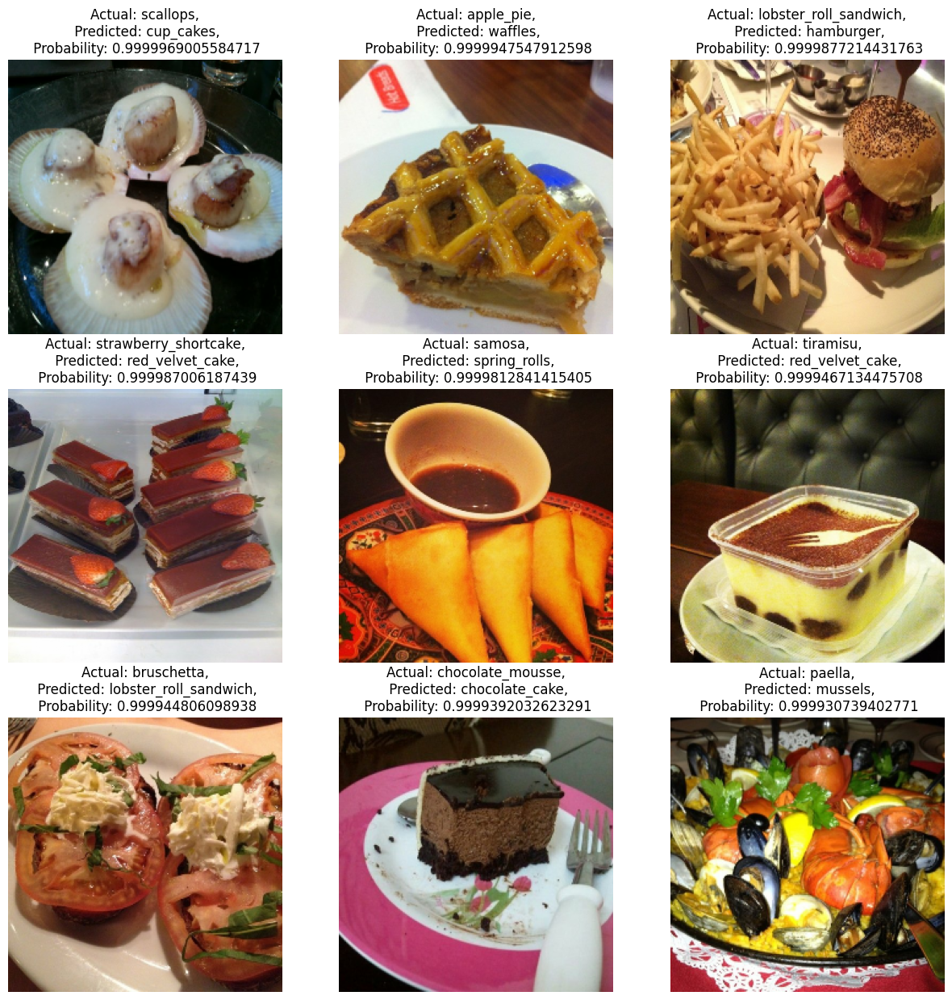

In [116]:
# 5. Visualize 
images_to_view = 9
start_index = 0
plt.figure(figsize=(15, 15))
for i, row in enumerate(top_100_wrong[start_index:start_index+images_to_view].itertuples()):
    plt.subplot(3, 3, i+1)
    img = load_and_prep_image(row[1], scale=False)
    _, _, _, _, pred_prob, y_true_classname, y_pred_classname, _ = row # only interested in a few parameters in a row
    plt.imshow(img/255.)
    plt.title(f'Actual: {y_true_classname},\n Predicted: {y_pred_classname},\n Probability: {pred_prob}')
    plt.axis(False)

### **Test the model on custom images**

In [118]:
# Get custom images
unzip_data('data/custom_food_images.zip', dest='data')

In [120]:
# Get the custom food images filepaths
custom_food_images = ['data/custom_food_images/' + img_path for img_path in os.listdir('data/custom_food_images')]
custom_food_images

['data/custom_food_images/chicken_wings.jpeg',
 'data/custom_food_images/hamburger.jpeg',
 'data/custom_food_images/pizza-dad.jpeg',
 'data/custom_food_images/ramen.jpeg',
 'data/custom_food_images/steak.jpeg',
 'data/custom_food_images/sushi.jpeg']

1/1 [==============================] - 0s 101ms/step


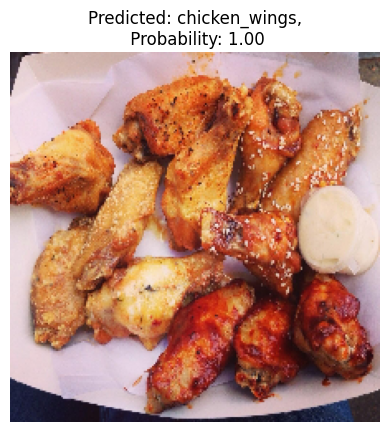

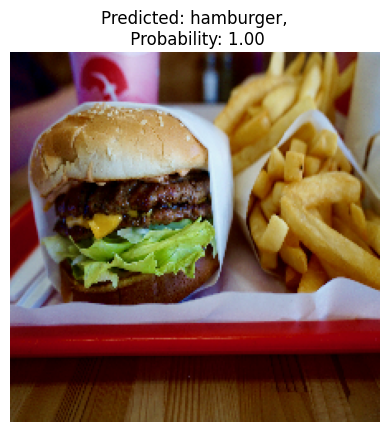

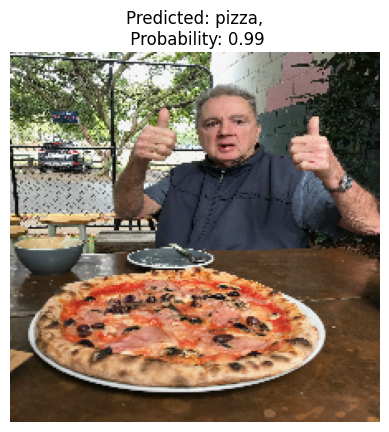

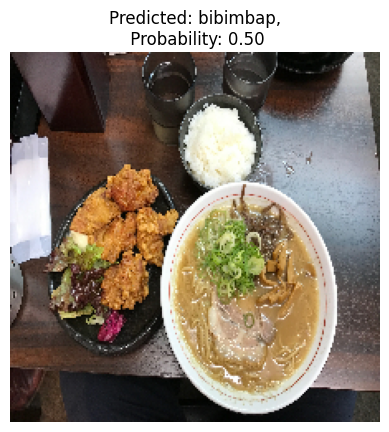

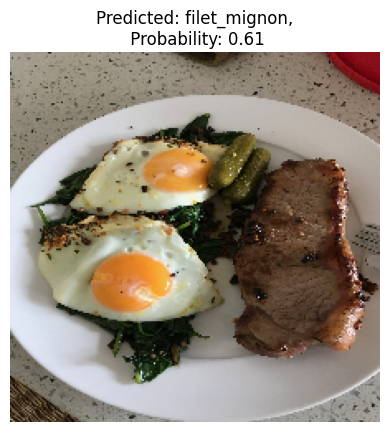

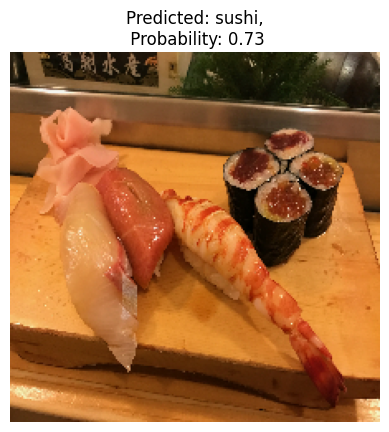

In [121]:
# Make predictions on and plot custom food images
for img in custom_food_images:
    img = load_and_prep_image(img, scale=False)
    pred_prob = model.predict(tf.expand_dims(img, axis=0))
    pred_class = class_names[pred_prob.argmax()]
    # Plot
    plt.figure()
    plt.imshow(img/255.)
    plt.title(f'Predicted: {pred_class},\n Probability: {pred_prob.max():.2f}')
    plt.axis(False)